# Обучение и оценка классификатора одежды

Ноутбук обучает TensorFlow/Keras-модель классификации изображений одежды по подкатегориям цифрового гардероба.

Перед запуском выполните `01_prepare_local_zip_subcategory_dataset.ipynb`, чтобы получить `wardrobe_classifier_outputs/samples.csv` и JSON-маппинги.


## Установка и проверка окружения

Используйте серверное Python-окружение с настроенными TensorFlow и GPU-драйверами.


In [1]:
!pip -q install tensorflow pandas numpy scikit-learn matplotlib seaborn pillow tqdm

In [4]:
!pip uninstall -y "tensorflow[and-cude]"

Found existing installation: tensorflow 2.21.0
Uninstalling tensorflow-2.21.0:
  Successfully uninstalled tensorflow-2.21.0


In [5]:
!pip install -U "tensorflow[and-cuda]==2.18.1"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.6/615.6 MB 5.5 MB/s eta 0:00:0000:01m00:02
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.3/363.3 MB 6.1 MB/s eta 0:00:0000:0100:02m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 7.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.5/22.5 MB 7.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.9/24.9 MB 7.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 895.7/895.7 kB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 577.2/577.2 MB 5.5 MB/s eta 0:00:0000:0100:02m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 MB 5.7 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 6.4 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.3/130.3 MB 7.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [1]:
import tensorflow as tf

print(tf.test.is_built_with_cuda())
print(tf.config.list_physical_devices('GPU'))

2026-05-17 17:55:01.237523: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-17 17:55:01.319412: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1779040501.330569 4159489 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1779040501.334055 4159489 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-05-17 17:55:01.348140: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

True
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [2]:
import json
import shutil
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, confusion_matrix, f1_score

RANDOM_SEED = 42
IMG_SIZE = (320, 320)
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE
PROJECT_DIR = Path.cwd()
OUTPUT_DIR = PROJECT_DIR / "wardrobe_classifier_outputs"
SAMPLES_PATH = OUTPUT_DIR / "samples.csv"

np.random.seed(RANDOM_SEED)
tf.keras.utils.set_random_seed(RANDOM_SEED)

print("TensorFlow:", tf.__version__)
print("GPU:", tf.config.list_physical_devices("GPU"))
print("Артефакты:", OUTPUT_DIR)

TensorFlow: 2.18.1
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
Артефакты: /home/miss_kovinko/vkr/wardrobe_classifier_outputs


## Загрузка датасета

Загружаются `samples.csv`, split CSV и маппинги, подготовленные первым ноутбуком.

In [3]:
def read_json(path: Path):
    return json.loads(path.read_text(encoding="utf-8"))


if not SAMPLES_PATH.exists():
    raise FileNotFoundError("Не найден samples.csv. Сначала выполните 01_prepare_hm_dataset.ipynb.")

samples = pd.read_csv(SAMPLES_PATH, dtype={"article_id": "string"})
train_df = samples[samples["split"] == "train"].copy()
val_df = samples[samples["split"] == "val"].copy()
test_df = samples[samples["split"] == "test"].copy()

subcategory_to_id = read_json(OUTPUT_DIR / "subcategory_to_id.json")
category_to_id = read_json(OUTPUT_DIR / "category_to_id.json")
subcategory_to_category = read_json(OUTPUT_DIR / "subcategory_to_category.json")
subcategory_names = read_json(OUTPUT_DIR / "subcategory_names.json")
category_names = read_json(OUTPUT_DIR / "category_names.json")

print("samples:", samples.shape)
print("train / val / test:", len(train_df), len(val_df), len(test_df))
print("Категорий:", len(category_names))
print("Подкатегорий:", len(subcategory_names))

samples: (60359, 8)
train / val / test: 48279 6040 6040
Категорий: 6
Подкатегорий: 50


## Анализ samples.csv

Проверяем фактические размеры классов и наличие всех подкатегорий в split.

In [4]:
real_class_counts = samples.groupby(["target_category", "target_subcategory"], as_index=False).size().rename(columns={"size": "real_image_count"}).sort_values("real_image_count")
split_table = pd.crosstab(samples["target_subcategory"], samples["split"]).reindex(subcategory_names).fillna(0).astype(int)
display(real_class_counts)
display(split_table)
missing_in_split = split_table[(split_table.get("train", 0) == 0) | (split_table.get("val", 0) == 0) | (split_table.get("test", 0) == 0)]
if len(missing_in_split):
    print("Есть классы без одного из split, проверьте low_image_count:")
    display(missing_in_split)
else:
    print("Все подкатегории представлены в train, val и test.")

,target_category,target_subcategory,real_image_count
19,верхняя одежда,Комбинезоны,54
17,верхняя одежда,Дублёнка,55
4,верх,Жилет,91
36,обувь,Сапоги,106
38,обувь,Туфли на каблуке,139
15,верхняя одежда,Верхний жилет,180
22,верхняя одежда,Тренч_плащ,188
18,верхняя одежда,Кожанка_косуха,214
30,обувь,Босоножки на каблуке,250
31,обувь,Ботильоны,270


split,test,train,val
target_subcategory,,,
Блузка,245,1958,245
Боди,47,374,47
Водолазка,44,356,44
Джемпер,388,3100,388
Жилет,10,71,10
Кардиган,83,660,83
Кофта,305,2438,305
Лонгслив,57,459,57
Майка,228,1820,228


Все подкатегории представлены в train, val и test.


## Балансировка

Балансировка применяется только к `train`: oversampling строк dataframe без копий файлов, subset крупных классов и sample weights по формуле `1 / sqrt(class_count)`.

In [5]:
def target_effective_count(class_count: int) -> int:
    """Целевой эффективный размер класса в train после oversampling/subset."""
    if class_count >= 1000:
        return 1000
    if class_count >= 300:
        return 1000
    if class_count >= 100:
        return 900
    return 700


def make_balanced_train_dataframe(df: pd.DataFrame, seed: int = RANDOM_SEED):
    """Создает сбалансированный train dataframe без копирования файлов на диске."""
    parts, rows = [], []
    for subcategory, group in df.groupby("target_subcategory", sort=False):
        count = len(group)
        target = target_effective_count(count)
        replace = count < target
        parts.append(group.sample(n=target, replace=replace, random_state=seed))
        rows.append({
            "target_subcategory": subcategory,
            "real_train_count": count,
            "effective_train_count": target,
            "is_rare": count < 100,
            "sampling_mode": "oversampling" if replace else "subset",
        })
    balanced = pd.concat(parts, ignore_index=True).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    return balanced, pd.DataFrame(rows).sort_values("real_train_count")


def compute_subcategory_sample_weights(df: pd.DataFrame):
    """Считает веса 1/sqrt(class_count) и нормализует их без экстремальных значений."""
    counts = df["target_subcategory"].value_counts()
    raw = 1.0 / np.sqrt(counts.astype(float))
    weights = raw / raw.mean()
    weights = weights.clip(lower=0.5, upper=3.0)
    weights = weights / weights.mean()
    return weights.to_dict()


balanced_train_df, balance_report = make_balanced_train_dataframe(train_df)
subcategory_weights = compute_subcategory_sample_weights(train_df)
balance_report["class_weight"] = balance_report["target_subcategory"].map(subcategory_weights)
balance_report.to_csv(OUTPUT_DIR / "train_balance_report.csv", index=False)

print("Реальный train:", len(train_df))
print("Эффективный train после oversampling/subset:", len(balanced_train_df))
display(balance_report)
print("Редкие классы:")
display(balance_report[balance_report["is_rare"]])

Реальный train: 48279
Эффективный train после oversampling/subset: 47900


,target_subcategory,real_train_count,effective_train_count,is_rare,sampling_mode,class_weight
17,Дублёнка,41,700,True,oversampling,2.957986
19,Комбинезоны,42,700,True,oversampling,2.957986
4,Жилет,71,700,True,oversampling,2.339932
36,Сапоги,84,700,True,oversampling,2.151260
38,Туфли на каблуке,111,900,False,oversampling,1.871419
15,Верхний жилет,144,900,False,oversampling,1.643052
22,Тренч_плащ,150,900,False,oversampling,1.609855
18,Кожанка_косуха,172,900,False,oversampling,1.503378
30,Босоножки на каблуке,200,900,False,oversampling,1.394176
31,Ботильоны,216,900,False,oversampling,1.341546


Редкие классы:


,target_subcategory,real_train_count,effective_train_count,is_rare,sampling_mode,class_weight
17,Дублёнка,41,700,True,oversampling,2.957986
19,Комбинезоны,42,700,True,oversampling,2.957986
4,Жилет,71,700,True,oversampling,2.339932
36,Сапоги,84,700,True,oversampling,2.151260


## Подготовка tf.data

Train получает sample weights и аугментации внутри модели. Val/test используют только resize/normalization, без oversampling и train-аугментаций.

In [6]:
def add_label_columns(df: pd.DataFrame) -> pd.DataFrame:
    """Добавляет числовые id категорий и подкатегорий."""
    result = df.copy()
    result["subcategory_id"] = result["target_subcategory"].map(subcategory_to_id).astype("int32")
    result["category_id"] = result["target_category"].map(category_to_id).astype("int32")
    result["sample_weight"] = result["target_subcategory"].map(subcategory_weights).fillna(1.0).astype("float32")
    return result


balanced_train_df = add_label_columns(balanced_train_df)
val_df = add_label_columns(val_df)
test_df = add_label_columns(test_df)


def decode_and_resize(path):
    """Читает jpg и приводит изображение к IMG_SIZE."""
    image_bytes = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image_bytes, channels=3)
    image = tf.image.resize(image, IMG_SIZE, method="bilinear")
    return tf.cast(image, tf.float32)


def build_tf_dataset(df: pd.DataFrame, training: bool = True, include_labels: bool = True):
    """Создает tf.data.Dataset для обучения, оценки или инференса."""
    paths = df["image_path"].astype(str).values
    ds = tf.data.Dataset.from_tensor_slices(paths)

    if include_labels:
        weights = df["sample_weight"].astype("float32").values if training else np.ones(len(df), dtype="float32")
        labels_ds = tf.data.Dataset.from_tensor_slices((
            df["subcategory_id"].astype("int32").values,
            df["category_id"].astype("int32").values,
            weights,
        ))
        ds = tf.data.Dataset.zip((ds, labels_ds))

        def load_with_labels(path, labels):
            sub_id, cat_id, weight = labels
            image = decode_and_resize(path)
            y = {"subcategory": sub_id, "category": cat_id}
            sw = {"subcategory": weight, "category": tf.ones_like(weight, dtype=tf.float32)}
            return image, y, sw

        ds = ds.map(load_with_labels, num_parallel_calls=AUTOTUNE)
    else:
        ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)

    if training:
        ds = ds.shuffle(buffer_size=min(len(df), 5000), seed=RANDOM_SEED, reshuffle_each_iteration=True)
    return ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)


train_ds = build_tf_dataset(balanced_train_df, training=True)
val_ds = build_tf_dataset(val_df, training=False)
test_ds = build_tf_dataset(test_df, training=False)
print("Форма batch изображений:", next(iter(train_ds))[0].shape)

I0000 00:00:1779040694.527426 4159489 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 10264 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:01:00.0, compute capability: 8.6
I0000 00:00:1779040694.528778 4159489 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 10274 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:05:00.0, compute capability: 8.6


Форма batch изображений: (32, 320, 320, 3)


## Обучение модели

Используется transfer learning на `EfficientNetB0` с двумя головами. Итоговый loss: `subcategory_loss + 0.3 * category_loss`.

In [7]:
def build_augmentation_layer():
    """Умеренные train-аугментации без вертикального flip и сильного crop."""
    layers = [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.06, fill_mode="nearest"),
        tf.keras.layers.RandomZoom(height_factor=(-0.08, 0.08), width_factor=(-0.08, 0.08), fill_mode="nearest"),
        tf.keras.layers.RandomTranslation(height_factor=0.06, width_factor=0.06, fill_mode="nearest"),
        tf.keras.layers.RandomContrast(0.12),
    ]
    try:
        layers.append(tf.keras.layers.RandomBrightness(0.12, value_range=(0, 255)))
    except Exception:
        print("RandomBrightness недоступен, brightness-аугментация пропущена.")
    return tf.keras.Sequential(layers, name="train_augmentation")


def build_model(num_subcategories: int, num_categories: int, image_size=IMG_SIZE, base_name: str = "efficientnetb0", train_base: bool = False):
    """Создает Keras-модель с двумя выходами: подкатегория и категория."""
    inputs = tf.keras.Input(shape=(*image_size, 3), name="image")
    x = build_augmentation_layer()(inputs)

    if base_name.lower() == "mobilenetv2":
        x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
        base_model = tf.keras.applications.MobileNetV2(include_top=False, weights="imagenet", input_shape=(*image_size, 3), pooling="avg")
    else:
        base_model = tf.keras.applications.EfficientNetB0(include_top=False, weights="imagenet", input_shape=(*image_size, 3), pooling="avg")

    base_model.trainable = train_base
    x = base_model(x, training=False if not train_base else None)
    x = tf.keras.layers.Dropout(0.25)(x)
    x = tf.keras.layers.Dense(256, activation="relu")(x)
    x = tf.keras.layers.Dropout(0.25)(x)
    return tf.keras.Model(
        inputs=inputs,
        outputs={
            "subcategory": tf.keras.layers.Dense(num_subcategories, activation="softmax", name="subcategory")(x),
            "category": tf.keras.layers.Dense(num_categories, activation="softmax", name="category")(x),
        },
    )


model = build_model(len(subcategory_names), len(category_names), base_name="efficientnetb0", train_base=False)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss={"subcategory": "sparse_categorical_crossentropy", "category": "sparse_categorical_crossentropy"},
    loss_weights={"subcategory": 1.0, "category": 0.3},
    metrics={
        "subcategory": [
            tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy"),
            tf.keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="top3_accuracy"),
        ],
        "category": [tf.keras.metrics.SparseCategoricalAccuracy(name="accuracy")],
    },
)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image (InputLayer)  │ (None, 320, 320,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ train_augmentation  │ (None, 320, 320,  │          0 │ image[0][0]       │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetb0      │ (None, 1280)      │  4,049,571 │ train_augmentati… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 1280)      │          0 │ efficientnetb0[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    327,936 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ category (Dense)    │ (None, 6)         │      1,542 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subcategory (Dense) │ (None, 50)        │     12,850 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,391,899 (16.75 MB)

 Trainable params: 342,328 (1.31 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

## Основное обучение модели

Режим рассчитан на 10-20 эпох с `EarlyStopping` и `ModelCheckpoint`.

In [8]:
EPOCHS = 15
BEST_MODEL_PATH = OUTPUT_DIR / "best_wardrobe_classifier.keras"
LAST_MODEL_PATH = OUTPUT_DIR / "last_wardrobe_classifier.keras"

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(str(BEST_MODEL_PATH), monitor="val_subcategory_accuracy", mode="max", save_best_only=True, verbose=1),
    tf.keras.callbacks.EarlyStopping(monitor="val_subcategory_accuracy", mode="max", patience=4, restore_best_weights=True, verbose=1),
    tf.keras.callbacks.ReduceLROnPlateau(monitor="val_subcategory_loss", mode="min", factor=0.3, patience=2, min_lr=1e-6, verbose=1),
]

history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=callbacks)
model.save(LAST_MODEL_PATH)
pd.DataFrame(history.history).to_csv(OUTPUT_DIR / "training_history.csv", index=False)
print("Лучшая модель:", BEST_MODEL_PATH)
print("Последняя модель:", LAST_MODEL_PATH)

Epoch 1/15


I0000 00:00:1779040772.353754 4167393 cuda_dnn.cc:529] Loaded cuDNN version 90300


1497/1497 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - category_accuracy: 0.8488 - category_loss: 0.4255 - loss: 1.4356 - subcategory_accuracy: 0.5354 - subcategory_loss: 1.3079 - subcategory_top3_accuracy: 0.7505
Epoch 1: val_subcategory_accuracy improved from None to 0.66258, saving model to /home/miss_kovinko/vkr/wardrobe_classifier_outputs/best_wardrobe_classifier.keras

Epoch 1: finished saving model to /home/miss_kovinko/vkr/wardrobe_classifier_outputs/best_wardrobe_classifier.keras
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 179s 114ms/step - category_accuracy: 0.8948 - category_loss: 0.2947 - loss: 0.9962 - subcategory_accuracy: 0.6440 - subcategory_loss: 0.9078 - subcategory_top3_accuracy: 0.8560 - val_category_accuracy: 0.9114 - val_category_loss: 0.2459 - val_loss: 1.1165 - val_subcategory_accuracy: 0.6626 - val_subcategory_loss: 1.0424 - val_subcategory_top3_accuracy: 0.9033 - learning_rate: 0.0010
Epoch 2/15
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - category_accuracy: 0.9276 - category_lo

## Оценка качества

Считаются accuracy, macro F1, weighted F1, balanced accuracy, top-3 accuracy, classification report и confusion matrix.

189/189 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step
Метрики:
split: test
accuracy: 0.7574503311258278
macro_f1: 0.7466736880503924
weighted_f1: 0.7627279490702824
balanced_accuracy: 0.8021120706094274
top3_accuracy: 0.9425496688741721


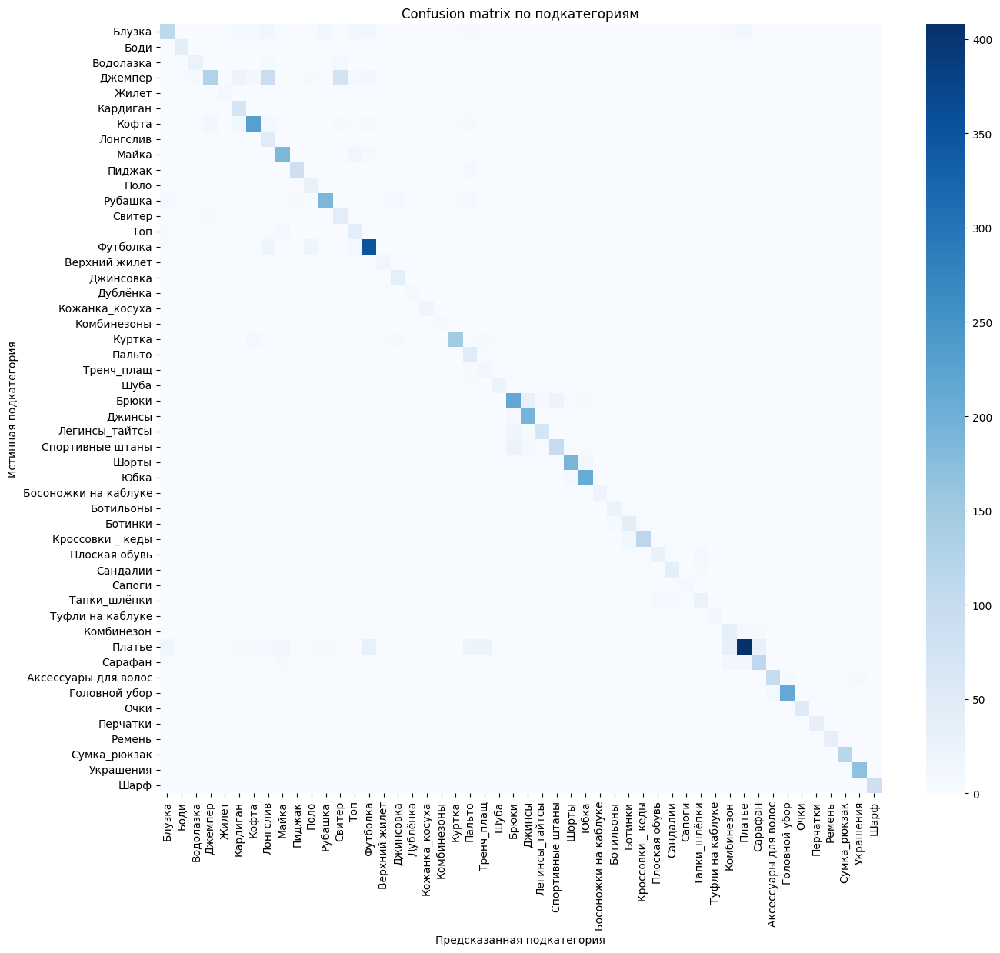

Качество по редким классам:


,precision,recall,f1-score,support
Дублёнка,1.000000,0.714286,0.833333,7.0
Комбинезоны,0.857143,1.000000,0.923077,6.0
Жилет,0.444444,0.800000,0.571429,10.0
Сапоги,0.750000,0.818182,0.782609,11.0


In [9]:
def predict_dataframe(model, df: pd.DataFrame):
    """Возвращает вероятности модели для dataframe."""
    pred_ds = build_tf_dataset(df, training=False, include_labels=False)
    preds = model.predict(pred_ds, verbose=1)
    if isinstance(preds, dict):
        return preds["subcategory"], preds["category"]
    return preds[0], preds[1]


def top_k_accuracy(y_true, probs, k=3):
    top_k = np.argsort(probs, axis=1)[:, -k:]
    return float(np.mean([true in row for true, row in zip(y_true, top_k)]))


def save_confusion_matrix(cm, labels, csv_path: Path, png_path: Path):
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)
    cm_df.to_csv(csv_path)
    plt.figure(figsize=(max(14, len(labels) * 0.25), max(12, len(labels) * 0.25)))
    sns.heatmap(cm_df, cmap="Blues", square=False, cbar=True)
    plt.title("Confusion matrix по подкатегориям")
    plt.xlabel("Предсказанная подкатегория")
    plt.ylabel("Истинная подкатегория")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(png_path, dpi=160)
    plt.show()


def evaluate_model(model, df: pd.DataFrame, split_name: str = "test"):
    """Считает метрики и сохраняет отчеты по split."""
    eval_df = add_label_columns(df)
    y_true = eval_df["subcategory_id"].values
    sub_probs, _ = predict_dataframe(model, eval_df)
    y_pred = sub_probs.argmax(axis=1)
    metrics = {
        "split": split_name,
        "accuracy": accuracy_score(y_true, y_pred),
        "macro_f1": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "weighted_f1": f1_score(y_true, y_pred, average="weighted", zero_division=0),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
        "top3_accuracy": top_k_accuracy(y_true, sub_probs, k=3),
    }
    print("Метрики:")
    for key, value in metrics.items():
        print(f"{key}: {value}")

    report_dict = classification_report(y_true, y_pred, labels=list(range(len(subcategory_names))), target_names=subcategory_names, output_dict=True, zero_division=0)
    report_df = pd.DataFrame(report_dict).T
    report_df.to_csv(OUTPUT_DIR / f"classification_report_{split_name}.csv")
    (OUTPUT_DIR / f"metrics_{split_name}.json").write_text(json.dumps(metrics, ensure_ascii=False, indent=2), encoding="utf-8")
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(subcategory_names))))
    save_confusion_matrix(cm, subcategory_names, OUTPUT_DIR / f"confusion_matrix_{split_name}.csv", OUTPUT_DIR / f"confusion_matrix_{split_name}.png")

    rare_classes = balance_report.loc[balance_report["is_rare"], "target_subcategory"].tolist()
    rare_report = report_df.loc[[cls for cls in rare_classes if cls in report_df.index]].copy()
    rare_report.to_csv(OUTPUT_DIR / f"rare_classes_report_{split_name}.csv")
    print("Качество по редким классам:")
    display(rare_report)

    top3_idx = np.argsort(sub_probs, axis=1)[:, -3:][:, ::-1]
    rows = []
    for row_idx, (_, row) in enumerate(eval_df.reset_index(drop=True).iterrows()):
        labels = [subcategory_names[i] for i in top3_idx[row_idx]]
        confs = [float(sub_probs[row_idx, i]) for i in top3_idx[row_idx]]
        rows.append({
            "article_id": row["article_id"],
            "image_path": row["image_path"],
            "true_subcategory": row["target_subcategory"],
            "pred_subcategory": subcategory_names[y_pred[row_idx]],
            "confidence": float(sub_probs[row_idx, y_pred[row_idx]]),
            "top3_subcategories": " | ".join(labels),
            "top3_confidences": " | ".join([f"{x:.4f}" for x in confs]),
        })
    predictions_df = pd.DataFrame(rows)
    predictions_df.to_csv(OUTPUT_DIR / f"predictions_{split_name}.csv", index=False)
    return metrics, report_df, predictions_df


eval_model = tf.keras.models.load_model(BEST_MODEL_PATH) if BEST_MODEL_PATH.exists() else model
test_metrics, test_report, test_predictions = evaluate_model(eval_model, test_df, split_name="test")

## Примеры ошибок

Выводятся реальные изображения, истинная подкатегория, предсказанная подкатегория, top-3 и confidence.

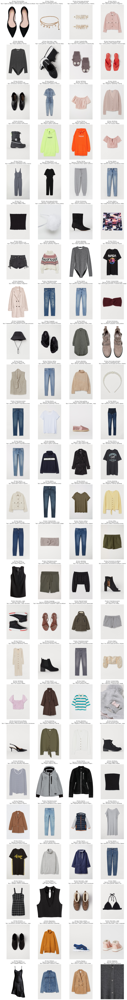

In [10]:
def show_error_examples(predictions_df: pd.DataFrame, n: int = 12):
    errors = predictions_df[predictions_df["true_subcategory"] != predictions_df["pred_subcategory"]].copy()
    if errors.empty:
        print("Ошибок в выбранном split не найдено.")
        return
    errors = errors.sort_values("confidence", ascending=False).head(n)
    cols = 4
    rows = int(np.ceil(len(errors) / cols))
    plt.figure(figsize=(cols * 4, rows * 5))
    for i, (_, row) in enumerate(errors.iterrows(), start=1):
        plt.subplot(rows, cols, i)
        try:
            plt.imshow(Image.open(row["image_path"]).convert("RGB"))
        except Exception:
            plt.text(0.5, 0.5, "Не удалось открыть изображение", ha="center")
        plt.axis("off")
        plt.title(
            f"Истина: {row['true_subcategory']}\nПрогноз: {row['pred_subcategory']} ({row['confidence']:.2f})\nTop-3: {row['top3_subcategories']}",
            fontsize=9,
        )
    plt.tight_layout()
    plt.show()


show_error_examples(test_predictions, n=100)

## Краткий вывод по качеству

Эта ячейка помогает быстро понять, какие классы модель определяет лучше и какие чаще путает.

In [11]:
per_class = test_report.loc[subcategory_names].copy()
per_class["support"] = per_class["support"].astype(int)
best_classes = per_class[per_class["support"] > 0].sort_values("f1-score", ascending=False).head(10)
worst_classes = per_class[per_class["support"] > 0].sort_values("f1-score", ascending=True).head(10)

print("Лучше всего определяются классы с высоким F1:")
display(best_classes[["precision", "recall", "f1-score", "support"]])
print("Сложные классы с низким F1:")
display(worst_classes[["precision", "recall", "f1-score", "support"]])
print(
    "Классы с похожим силуэтом и близкими H&M-описаниями могут путаться между собой: "
    "виды обуви, юбки разной длины, куртки/пуховики/пальто и похожие аксессуары. "
    "Для редких классов важны macro F1, balanced accuracy и top-3 accuracy."
)

Лучше всего определяются классы с высоким F1:


,precision,recall,f1-score,support
Очки,1.000000,1.000000,1.000000,52
Украшения,0.949438,0.954802,0.952113,177
Ремень,1.000000,0.897436,0.945946,39
Перчатки,0.894737,0.971429,0.931507,35
Сумка_рюкзак,0.887218,0.967213,0.925490,122
Головной убор,0.929825,0.917749,0.923747,231
Комбинезоны,0.857143,1.000000,0.923077,6
Шорты,0.909091,0.879630,0.894118,216
Юбка,0.860656,0.929204,0.893617,226
Шарф,0.838095,0.907216,0.871287,97


Сложные классы с низким F1:


,precision,recall,f1-score,support
Лонгслив,0.219178,0.842105,0.347826,57
Тренч_плащ,0.260000,0.684211,0.376812,19
Свитер,0.305556,0.733333,0.431373,60
Джемпер,0.771084,0.329897,0.462094,388
Комбинезон,0.389474,0.660714,0.490066,56
Топ,0.421569,0.614286,0.500000,70
Пальто,0.413223,0.892857,0.564972,56
Блузка,0.748344,0.461224,0.570707,245
Жилет,0.444444,0.800000,0.571429,10
Тапки_шлёпки,0.583333,0.595745,0.589474,47


Классы с похожим силуэтом и близкими H&M-описаниями могут путаться между собой: виды обуви, юбки разной длины, куртки/пуховики/пальто и похожие аксессуары. Для редких классов важны macro F1, balanced accuracy и top-3 accuracy.


In [12]:
# Сборка итоговой модели в один файл для сохранения/переноса

from pathlib import Path
import shutil
import zipfile

FINAL_MODEL_PATH = OUTPUT_DIR / "final_wardrobe_classifier.keras"
FINAL_BUNDLE_PATH = OUTPUT_DIR / "final_wardrobe_classifier_bundle.zip"

# Берем лучшую модель, если она была сохранена callback'ом.
# Если файла лучшей модели нет, сохраняем текущую модель из памяти.
if BEST_MODEL_PATH.exists():
    shutil.copy2(BEST_MODEL_PATH, FINAL_MODEL_PATH)
    print("Итоговая модель взята из лучшего чекпоинта:", BEST_MODEL_PATH)
else:
    model.save(FINAL_MODEL_PATH)
    print("Лучший чекпоинт не найден, сохранена текущая модель из памяти.")

metadata_files = [
    "category_to_id.json",
    "subcategory_to_id.json",
    "subcategory_to_category.json",
    "category_names.json",
    "subcategory_names.json",
    "taxonomy.csv",
]

with zipfile.ZipFile(FINAL_BUNDLE_PATH, "w", compression=zipfile.ZIP_DEFLATED) as archive:
    archive.write(FINAL_MODEL_PATH, arcname=FINAL_MODEL_PATH.name)

    for filename in metadata_files:
        path = OUTPUT_DIR / filename
        if path.exists():
            archive.write(path, arcname=filename)
        else:
            print("Файл не найден и не добавлен:", path)

print("Итоговая модель:", FINAL_MODEL_PATH)
print("Итоговый архив для переноса:", FINAL_BUNDLE_PATH)

Итоговая модель взята из лучшего чекпоинта: /home/miss_kovinko/vkr/wardrobe_classifier_outputs/best_wardrobe_classifier.keras
Итоговая модель: /home/miss_kovinko/vkr/wardrobe_classifier_outputs/final_wardrobe_classifier.keras
Итоговый архив для переноса: /home/miss_kovinko/vkr/wardrobe_classifier_outputs/final_wardrobe_classifier_bundle.zip


## Проверка на личных изображениях

Можно положить изображения в локальную папку проекта `my_test_images/`. Разметка личных фотографий не требуется.


In [ ]:
def prepare_personal_images(folder: Path = Path.cwd() / "my_test_images", use_upload: bool = False):
    """Возвращает список пользовательских изображений."""
    folder.mkdir(parents=True, exist_ok=True)
    if use_upload:
        print("На сервере положите изображения в локальную папку my_test_images.")
    exts = {".jpg", ".jpeg", ".png", ".webp"}
    return sorted([p for p in folder.iterdir() if p.suffix.lower() in exts])


def predict_personal_images(model, folder: str | Path = Path.cwd() / "my_test_images", use_upload: bool = False, top_k: int = 3):
    """Показывает top-k предсказаний для личных фотографий."""
    image_paths = prepare_personal_images(Path(folder), use_upload=use_upload)
    if not image_paths:
        print(f"В папке нет изображений. Добавьте файлы в {folder}.")
        return pd.DataFrame()

    df = pd.DataFrame({"image_path": [str(p) for p in image_paths]})
    preds = model.predict(build_tf_dataset(df, training=False, include_labels=False), verbose=1)
    sub_probs = preds["subcategory"] if isinstance(preds, dict) else preds[0]
    top_idx = np.argsort(sub_probs, axis=1)[:, -top_k:][:, ::-1]

    rows = []
    cols = min(3, len(image_paths))
    fig_rows = int(np.ceil(len(image_paths) / cols))
    plt.figure(figsize=(cols * 5, fig_rows * 5))
    for i, path in enumerate(image_paths):
        labels = [subcategory_names[j] for j in top_idx[i]]
        confs = [float(sub_probs[i, j]) for j in top_idx[i]]
        categories = [subcategory_to_category[label] for label in labels]
        rows.append({
            "image_path": str(path),
            "top1_subcategory": labels[0],
            "top1_category": categories[0],
            "top1_confidence": confs[0],
            "top3_subcategories": " | ".join(labels),
            "top3_categories": " | ".join(categories),
            "top3_confidences": " | ".join([f"{x:.4f}" for x in confs]),
        })
        plt.subplot(fig_rows, cols, i + 1)
        plt.imshow(Image.open(path).convert("RGB"))
        plt.axis("off")
        plt.title("\n".join([f"{lbl} / {cat}: {conf:.2f}" for lbl, cat, conf in zip(labels, categories, confs)]), fontsize=10)
    plt.tight_layout()
    plt.show()
    result = pd.DataFrame(rows)
    result.to_csv(OUTPUT_DIR / "personal_image_predictions.csv", index=False)
    display(result)
    return result


# Для проверки положите изображения в папку my_test_images.
personal_predictions = predict_personal_images(eval_model, folder=Path.cwd() / "my_test_images", use_upload=False)


## Сохраненные артефакты

Артефакты сохраняются в локальную папку проекта `wardrobe_classifier_outputs/`.


In [ ]:
def copy_outputs_to_dir(target_dir: str | Path = "wardrobe_classifier_outputs_copy"):
    """Копирует артефакты в указанную локальную папку."""
    target_path = Path(target_dir)
    target_path.mkdir(parents=True, exist_ok=True)
    for path in OUTPUT_DIR.iterdir():
        if path.is_file():
            shutil.copy2(path, target_path / path.name)
    print("Артефакты скопированы в:", target_path)
    return target_path


print("Текущие артефакты:")
for path in sorted(OUTPUT_DIR.glob("*")):
    print("-", path.name)

# Если нужно скопировать артефакты в другую локальную папку, можно раскомментировать:
# copy_outputs_to_dir()


## Что получилось

Финальный блок кратко фиксирует результат обучения и место хранения артефактов.

In [ ]:
print("Всего изображений использовано:", len(samples))
print("Категорий:", len(category_names))
print("Подкатегорий:", len(subcategory_names))
print("Train / val / test:")
print(samples["split"].value_counts().to_string())
print("\nДисбаланс решен через:")
print("- сохранение всех исходных изображений в samples.csv;")
print("- oversampling редких и средних классов только в train dataframe;")
print("- subset крупных классов только на уровне train dataframe;")
print("- sample weights по формуле 1/sqrt(class_count) с нормализацией;")
print("- честные val/test без oversampling и train-аугментаций.")
print("\nМетрики test:")
for key, value in test_metrics.items():
    print(f"{key}: {value}")
print("\nАртефакты лежат в:", OUTPUT_DIR)